<div class="alert alert-block alert-info" >
    <h1>Robot Perception</h1>
    <h3>General Information:</h3>
    <p>Please do not add or delete any cells. Answers belong into the corresponding cells (below the question). If a function is given (either as a signature or a full function), you should not change the name, arguments or return value of the function.<br><br> If you encounter empty cells underneath the answer that can not be edited, please ignore them, they are for testing purposes.<br><br>When editing an assignment there can be the case that there are variables in the kernel. To make sure your assignment works, please restart the kernel and run all cells before submitting (e.g. via <i>Kernel -> Restart & Run All</i>).</p>
    <p>Code cells where you are supposed to give your answer often include the line  ```raise NotImplementedError```. This makes it easier to automatically grade answers. If you edit the cell please outcomment or delete this line. </p>
    <br>The server resource is limited to 2 core cpu and 1GB RAM at max per user. If you use more than that, the kernel may die. Nevertheless, you can bring it up again by restaring the kernel (Kernel -> Restart and clear output).<br>
    <h3>Submission:</h3>
    <p>Upload all attachments required to run the notebook and provide a correct path to them.</p>
    <p><strike>Please submit your notebook via the web interface (in the main view -> Assignments -> Submit)</strike>.</p> 
    <p>Starting from RP-HW07 onwards, submit the notebook and pdf version of it via LEA.</p>
    <p>The assignments are due on <b>Monday at 0:00.</b> (i.e. Sunday 23:59 + 1 min)</p>
    <h3>Group Work:</h3>
    <p>You are allowed to work in groups of up to two people. Please enter the UID (your username here) of each member of the group into the next cell. We apply plagiarism checking, so do not submit solutions from other people except your team members. If an assignment has a copied solution, the task will be graded with 0 points for all people with the same solution.</p>
    <p><b>YOU SHOULD ONLY SUBMIT EXACTLY ONE PER GROUP</b></p>
    <h3>Questions about the Assignment:</h3>
    <p>If you have questions about the assignment please post them in the LEA forum before the deadline. Don't wait until the last day to post questions.</p></div>

<div class="alert alert-block alert-danger">
<p><b>Put your answer in the PROVIDED CELLS only!</b></p>
<b>Any new cell is not visible during the grading.</b>
<p>We provide additional code and markdown cells for each question, so that you do not have to add the new ones.</p>
<p>Do not copy the metadata from one cell to another as it is unique to that cell only.</p></div>

In [1]:
'''
Group Work:
Enter the UID (i.e. student2s) of each team member into the variables. 
If you work alone please leave the second variable empty, or extend this list if necessary.
'''
member1 = 'dpadma2s'
member2 = 'jbandl2s'
member3 = 'smuthi2s'

## Q&As: Pose three questions (and ans.) to last lecture, 3 Q&As per member [1 point]

The format of the question and answer should be [Q1,A1,Q2,A2,Q3,A3,...,Qn,An], where Q1 is the question and A1 is the answer.<br>
If you work in a group, the total of the Q&As is $3xn$, where $n$ is the total number of members.<br>

Put your answer in the provided cell below!<br>
If you work in a group, you can extend the provided Q&A template, but please use the same format:
1. Q and A are separated by ONE $<$br$>$
2. Q&A and other Q&As are separated by TWO $<$br$>$

Or copy the provided format in the answer cell, and change the Q&A number.
<br>
Do not remove any markdown tag like $<$br$>$ in the answer cell.

<br>
Q1 = Your first question here!
<br>
A1 = Your Q1 answer here!
<br>
<br>
Q2 = Your second question here!
<br>
A2 = Your Q2 answer here!
<br>
<br>
Q3 = Your third question here!
<br>
A3 = Your Q3 answer here!
<br>
<br>
Q4 = Your first question here!
<br>
A4 = Your Q1 answer here!
<br>
<br>
Q5 = Your second question here!
<br>
A5 = Your Q2 answer here!
<br>
<br>
Q6 = Your third question here!
<br>
A6 = Your Q3 answer here!
<br>
<br>
Q7 = Your first question here!
<br>
A7 = Your Q1 answer here!
<br>
<br>
Q8 = Your second question here!
<br>
A8 = Your Q2 answer here!
<br>
<br>
Q9 = Your third question here!
<br>
A9 = Your Q3 answer here!

In [ ]:
'''
Provide the time required to solve the assignment per task as well as the sum (in minutes).
Extend this list if needed.
'''

Task1 = 0
Task2 = 0
Task3 = 0
Task4 = 0
Sum = 0


## Task1: Read this [MATLAB explanation](https://de.mathworks.com/help/vision/examples/measuring-planar-objects-with-a-calibrated-camera.html). Rehearse this experiment using your own smart phone camera (or some BETTER camera if available) , in openCV (if possible) and use a different object (like a book, match box etc). Then: 
### - Compare your result to the measurements done on the real object. How large is the difference? 
### - Taking your observed error, is this lay inside the error bounds produced by the calibration algorithm?

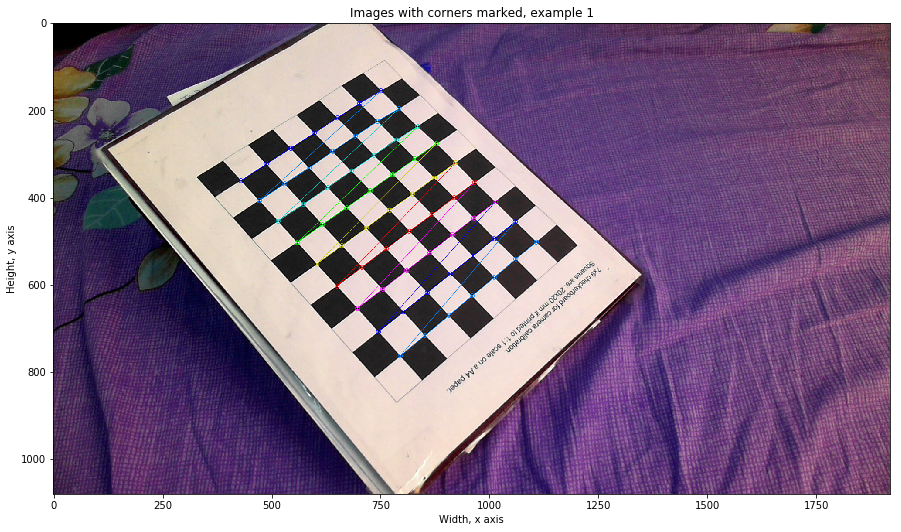

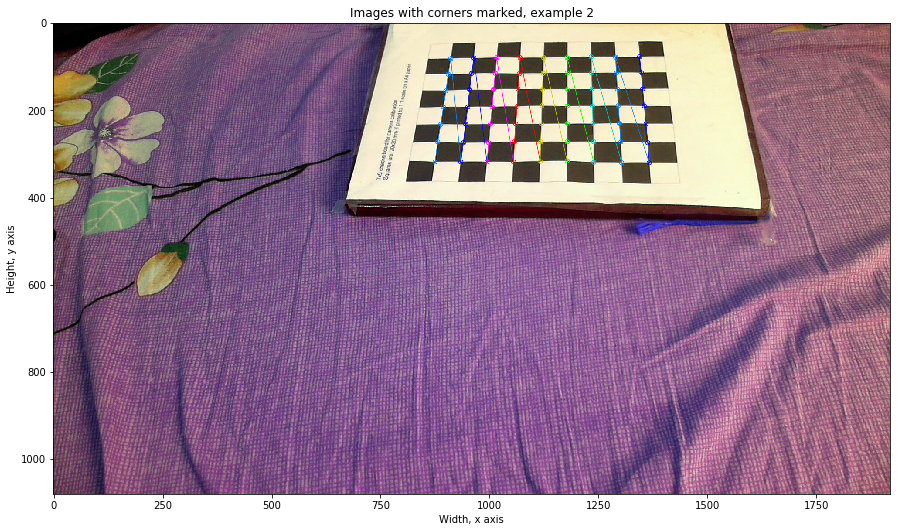

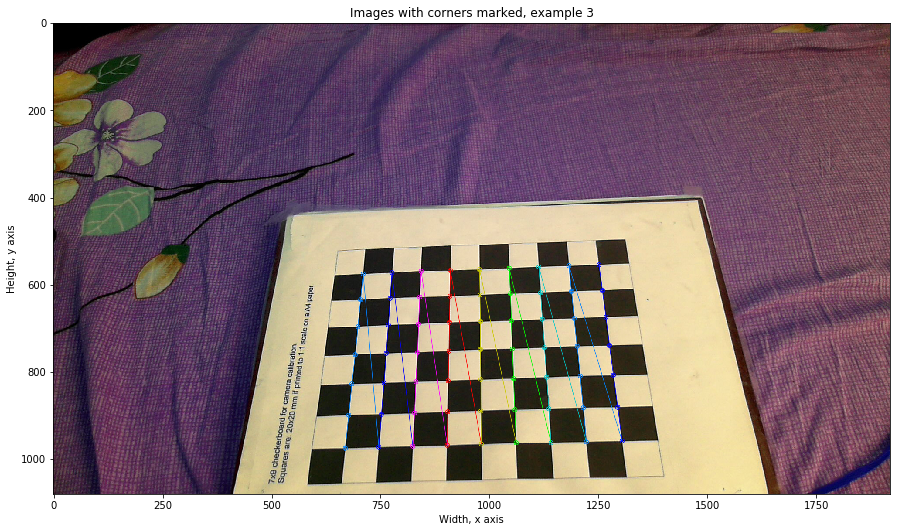

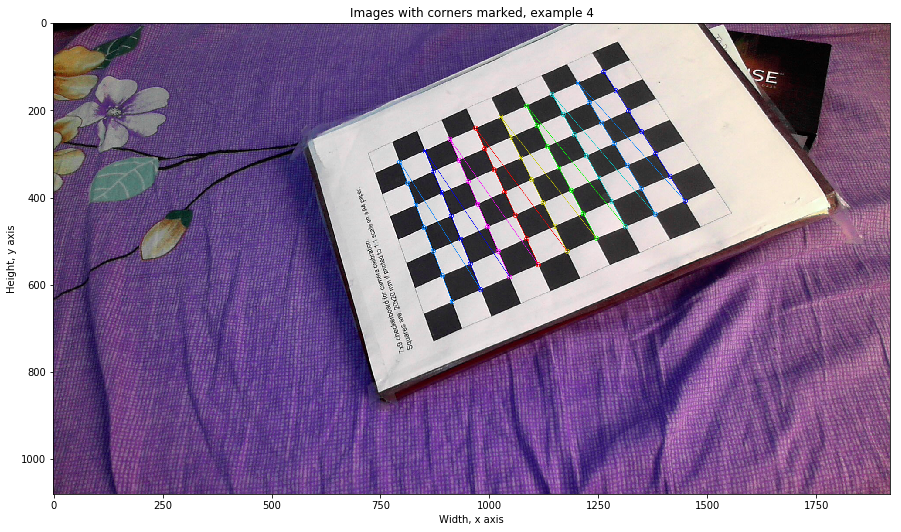

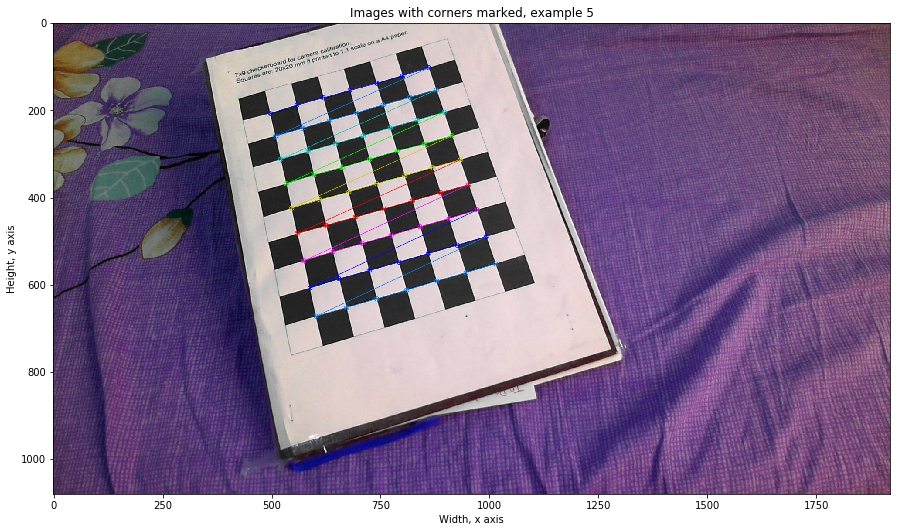

Camera matrix (Focal length in mm):
 [[ 20.60025669   0.         964.61858884]
 [  0.          36.31960977 522.84961464]
 [  0.           0.           1.        ]]
Distortion coefficients:
 [[-0.01846476  0.12160998  0.01312348  0.00331914 -0.30123076]]


In [353]:
import numpy as np
import cv2
import glob
from matplotlib import pyplot as plt
from copy import deepcopy
import rawpy

def get_points(images_path,pattern_shape):
    # termination criteria
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((pattern_shape[0]*pattern_shape[1],3), np.float32)
    objp[:,:2] = np.mgrid[0:pattern_shape[0],0:pattern_shape[1]].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d point in real world space
    imgpoints = [] # 2d points in image plane.

    images = glob.glob(images_path+'*.jpg')
    count = 0
    for fname in images:
#         with rawpy.imread(fname) as raw:
#             img = raw.postprocess()
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        # Find the chess board corners
        ret, corners = cv2.findChessboardCorners(gray, (pattern_shape[0],pattern_shape[1]),None)
        # If found, add object points, image points (after refining them)
        if ret == True:
            objpoints.append(objp)

            corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
            imgpoints.append(corners2)
            # Display only five images
            if count<5:
                plt.figure(figsize=(15,10))
                # Draw and display the corners
                img = cv2.drawChessboardCorners(img, (pattern_shape[0],pattern_shape[1]), corners2,ret)
                plt.imshow(img)
                plt.title('Images with corners marked, example {}'.format(count+1))
                plt.xlabel('Width, x axis')
                plt.ylabel('Height, y axis')
                plt.show()
            count+=1
            
    return objpoints, imgpoints, gray.shape[::-1]

def camera_calibration(objpoints,imgpoints,image_shape):
    return cv2.calibrateCamera(objpoints, imgpoints, image_shape,None,None)

def get_newmatrix(mtx,dist,image_shape):
    w = image_shape[0]
    h = image_shape[1]
    return cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))

def undistort_image(image,mtx,dist,newcameramtx,roi):
    # undistort
    dst = cv2.undistort(image, mtx, dist, None, newcameramtx)

    # crop the image
    x,y,w,h = roi
    dst = dst[y:y+h, x:x+w]
    return dst


images_path = "./webcam_2/"
pattern_shape = [7,9]
objpoints,imgpoints,image_shape = get_points(images_path,pattern_shape)
ret, mtx, dist, rvecs, tvecs = camera_calibration(objpoints,imgpoints,image_shape)

# Here the focal lengths are in pixels.
newcameramtx, roi = get_newmatrix(mtx,dist,image_shape)

# Conversion from pixels to mm scale for focal length
one_plus_sensorwidth = 25
image_width = image_shape[0]
image_height = image_shape[1]
new_camera_matix = deepcopy(mtx)
# F(mm) = F(pixel) * sensorwidth/image_width 
new_camera_matix[0][0] = new_camera_matix[0][0] * one_plus_sensorwidth /image_width
new_camera_matix[1][1] = new_camera_matix[1][1] * one_plus_sensorwidth /image_height


print("Camera matrix (Focal length in mm):\n",new_camera_matix)
# print("Rotation vector:\n",rvecs)
# print("Translation vector:\n",tvecs)
print("Distortion coefficients:\n",dist)
# print("New camera matrix:\n",newcameramtx)

with open("camera_parameter_file.txt",'w',encoding = 'utf-8') as f:
    f.write("Camera matrix:\n")
    f.write("(Focal length, fx, fy are in mm)\n\n")
    for item in new_camera_matix:
        f.write("%s\n" % item)
    f.write("\nDistortion matrix\n\n")
    for item in dist:
        f.write("%s\n" % item)

projection error:  0.10773373208512961


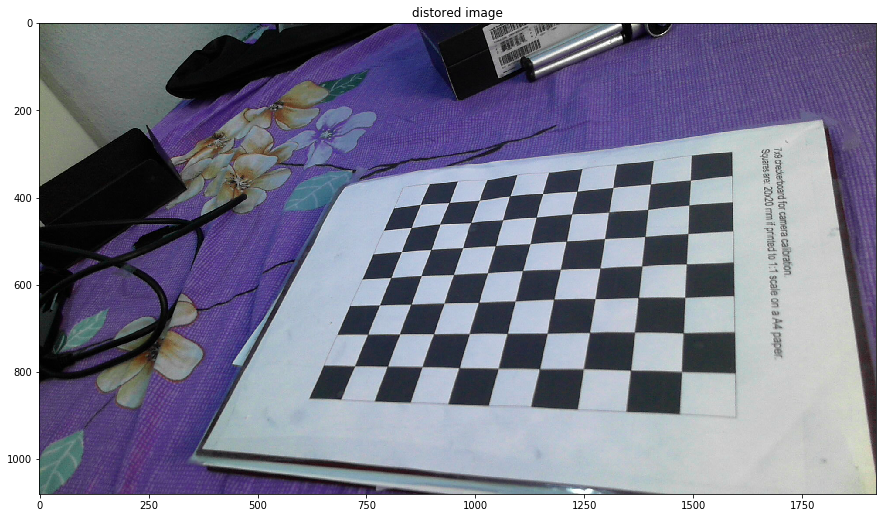

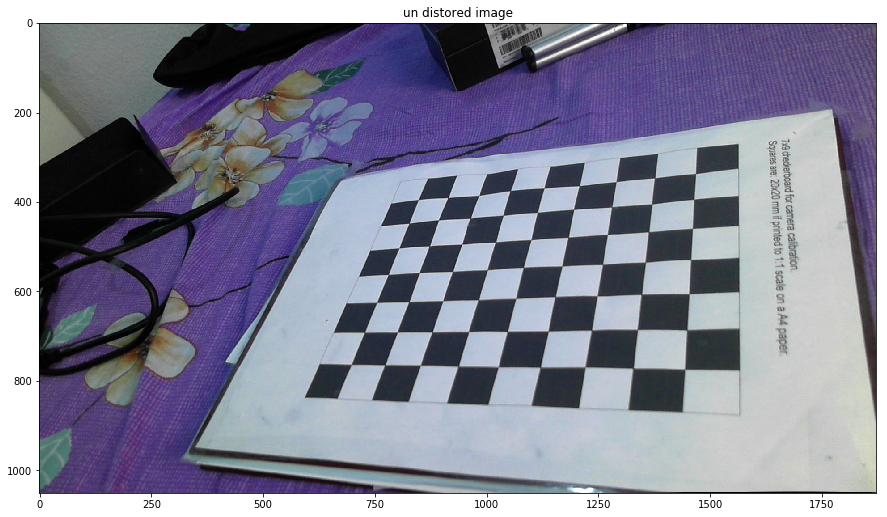

In [340]:
mean_error = 0
for i in range(0,len(objpoints)):
    imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
    error = cv2.norm(imgpoints[i],imgpoints2, cv2.NORM_L2)/len(imgpoints2)
    mean_error += error

print ("projection error: ", mean_error/len(objpoints))

image = cv2.imread("test_images/my_photo-1.jpg")
undistorted_image = undistort_image(image,mtx,dist,mtx,roi)
plt.figure(figsize=(15,10))
plt.title("distored image")
plt.imshow(image)
plt.show()
plt.figure(figsize=(15,10))
plt.title("un distored image")
plt.imshow(undistorted_image)
plt.show()

[1195, 495]
[1292, 495]
[-14.31012143   3.35545739  -3.42294058   1.        ] [-14.30928246   3.35504792  -3.4228533    1.        ]
0.00093762390936788
[1213, 241]
[1298, 241]
[-14.31051124   3.35341979  -3.42419752   1.        ] [-14.30977608   3.35306098  -3.42412104   1.        ]
0.000821615675471164


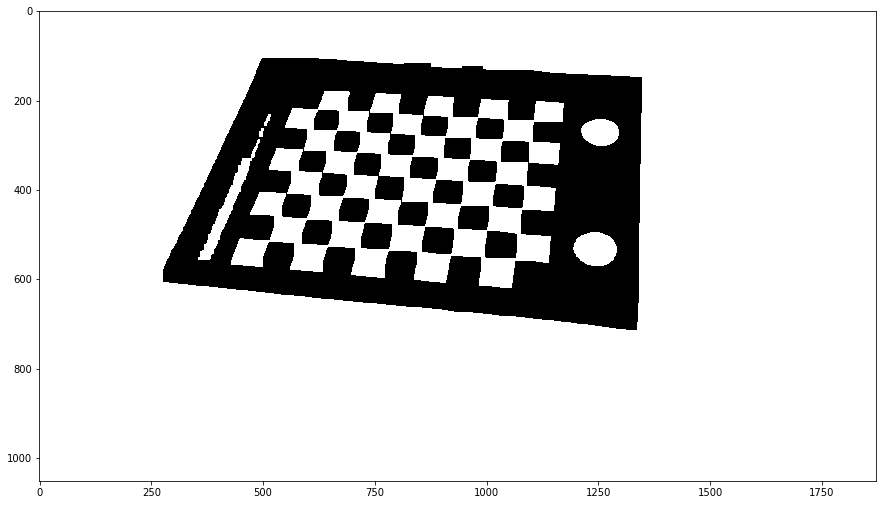

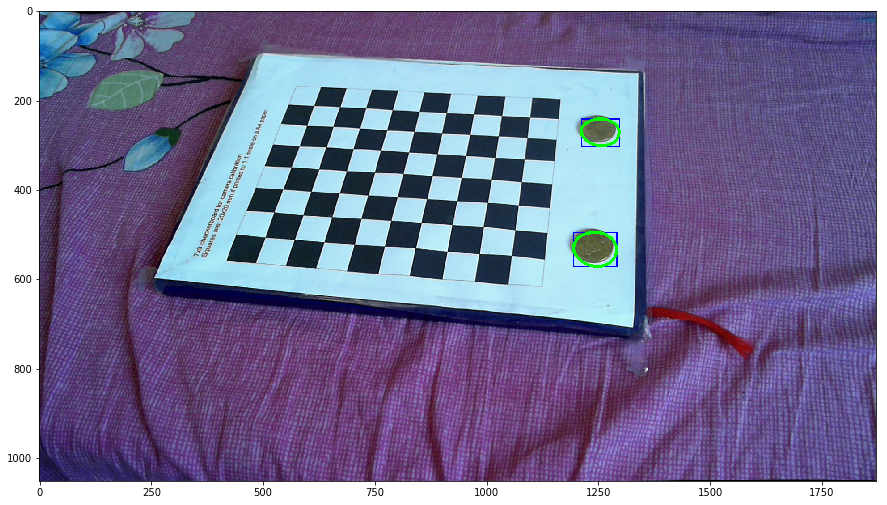

[788, 693]
[887, 693]
[-14.31321641   3.35870465  -3.42231433   1.        ] [-14.31236014   3.35828674  -3.42222525   1.        ]
0.0009569659632666159
[1021, 450]
[1112, 450]
[-14.31172301   3.35584435  -3.42332271   1.        ] [-14.31093594   3.35546022  -3.42324082   1.        ]
0.0008796228781363379
[254, 310]
[347, 310]
[-14.31865741   3.35800083  -3.42471457   1.        ] [-14.31785306   3.35760825  -3.42463089   1.        ]
0.0008989421965664095


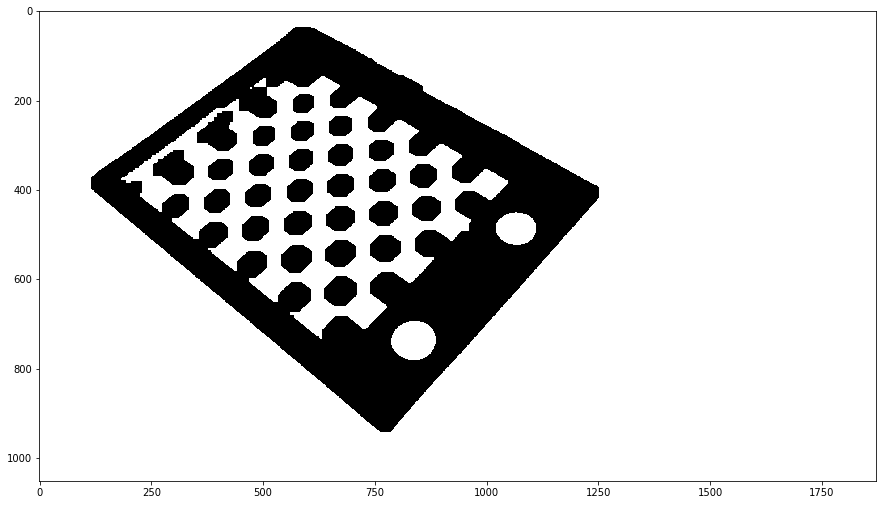

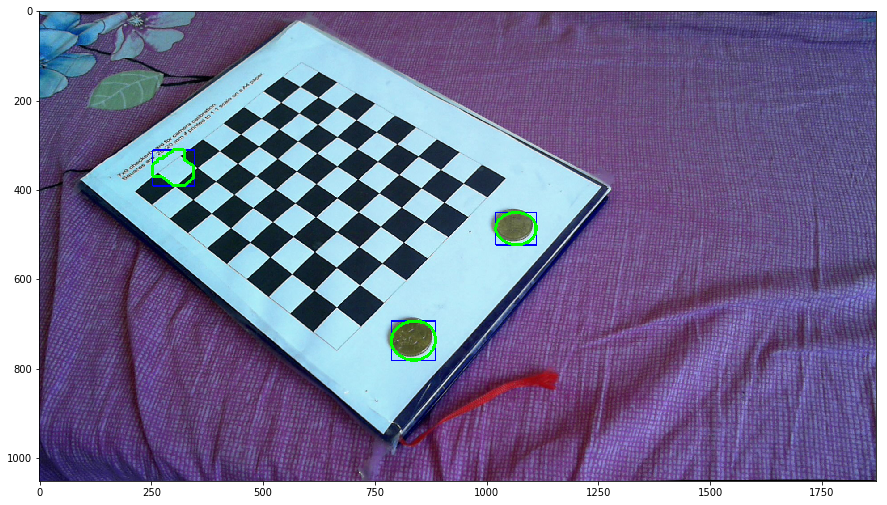

[684, 377]
[769, 377]
[-14.31479449   3.35670314  -3.42399184   1.        ] [-14.31405933   3.35634433  -3.42391536   1.        ]
0.0008216198889524904
[983, 262]
[1064, 262]
[-14.3124554    3.35455285  -3.42429922   1.        ] [-14.31175484   3.35421093  -3.42422633   1.        ]
0.0007829511985649793


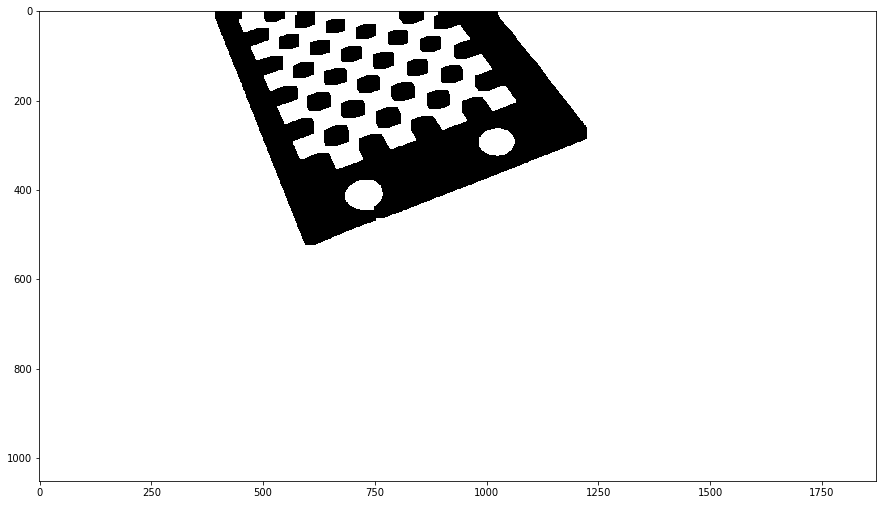

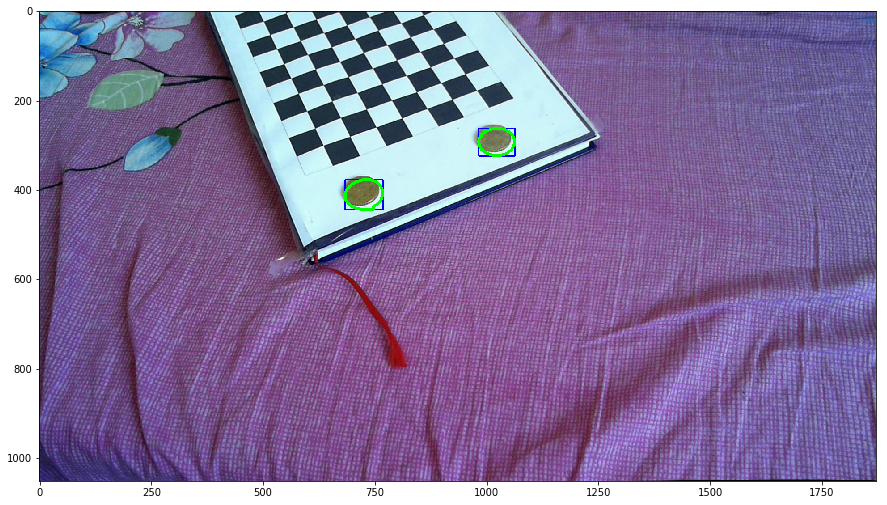

In [389]:
import imutils
folder_path = "./planarmeasure/webcam/"
img_paths = glob.glob(folder_path+"*jpg")

rvec = np.mean(rvecs,axis=0)
tvec = np.reshape(np.mean(tvecs,axis=0),(3,1))
r_mat,_ = cv2.Rodrigues(rvec)
H = np.hstack((r_mat,tvec))
# print(H)
def embed_from_R2_to_P2(point):
    '''
    Function to embed a point from R2 into P2
    parameters:
        point: ndarray: A point in R2
    return:
        point: ndarray: A point in P2
    '''
    point_in_P2 = np.append(point,1)
    return np.reshape(point_in_P2,(len(point_in_P2),1))
def normalize_point(point):
    '''
    Function to normalize a given point in P2
    parameters:
        point: ndarray: A point in P2
    return:
        normalized point: ndarray: A normalized point in P2
    '''
    return point/point[-1]


def project_to_world_coordinated(point,H,mtx):
    print(point)
    cx = mtx[0][2]
    cy = mtx[1][2]
    fx = mtx[0][0]
    fy = mtx[1][1]
    u = point[0]-cx
    v = point[1]-cy
    point_wrt_center = np.array([u,v,fx])
    point_camera_coordinates = np.dot(np.linalg.pinv(mtx),point_wrt_center)
    return np.dot(np.linalg.pinv(H),point_camera_coordinates)
for f in img_paths:
    img = cv2.imread(f)
    img = undistort_image(img,mtx,dist,mtx,roi)
    pixx,pixy,_= img.shape
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    thresh = cv2.threshold(gray, 0, 255,cv2.THRESH_BINARY_INV| cv2.THRESH_OTSU)[1]
    kernel = np.ones((4, 4), np.uint8)
    closing = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=8)
    kernel = np.ones((3, 3), np.uint8)
    closing = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel, iterations=2)
    cont_img = closing.copy()
    cnts = cv2.findContours(cont_img, cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
#     loop over the contours
    for (i, c) in enumerate(cnts):
        approx = cv2.approxPolyDP(c,0.01*cv2.arcLength(c,True),True)
        area = cv2.contourArea(c)
        if len(approx) in range(10,15) and (pixx*pixy/200) > area > (pixx*pixy/1300):
            # draw the contour
            x, y, w, h = cv2.boundingRect(c)
            cv2.rectangle(img, (x, y), (x + w, y + h), (255, 0, 0), 2) 
            point1 = normalize_point(project_to_world_coordinated([x,y],H,mtx))
            point2 = normalize_point(project_to_world_coordinated([x+w,y],H,mtx))
            print(point1,point2)
            print(np.linalg.norm(point1-point2))
            cv2.drawContours(img, [c], -1, (0, 255, 0), 5)
    plt.figure(figsize=(15,10))
    plt.imshow(cv2.cvtColor(closing,cv2.COLOR_BGR2RGB))
    plt.show()
    plt.figure(figsize=(15,10))
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    plt.show()



YOUR ANSWER HERE

##  Task2: Compare the MATLAB calibration process and the respective openCV calibration using Python, spell out in detail : 
### - Similarities / differences. 
### - Will both tools produce IDENTICAL results for IDENTICAL cameras? 
### - What makes the difference?

In [ ]:
# YOUR CODE HERE
raise NotImplementedError()

In [ ]:
# YOUR CODE HERE
raise NotImplementedError()

YOUR ANSWER HERE

## Task3: Read the slide set read the subsection on "Computation of F" (OR check the book Chapter 11). Implement a Normalized 8 point algorithm.

### Use the following signature: 

#### `fNorm8Point = estimateFundamentalMatrix(inlierPts1, inlierPts2)` 

where the inliers denote the pixel coordinates of corresponding points in left / right image. 

Image material can be found under images, and also some point arrays (`FMatrixCorrPointsStereo.txt`) for corresponding points in left and right image of image number 7 (`images/7.picture-24.jpg`)

In [ ]:
# YOUR CODE HERE
raise NotImplementedError()

In [ ]:
# YOUR CODE HERE
raise NotImplementedError()

YOUR ANSWER HERE

## Task4: Draw the respective epipoles on top of the images based the matrix F and corresponding points you found in task4

In [ ]:
# YOUR CODE HERE
raise NotImplementedError()

In [ ]:
# YOUR CODE HERE
raise NotImplementedError()

YOUR ANSWER HERE